In [1]:
import pandas as pd
import seaborn as sns 
import plotly.express as px
import matplotlib.pyplot as plt
from scipy.stats import zscore




In [3]:
df = pd.read_csv("data/benin-malanville.csv")  


In [4]:
df.describe()

,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
count,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,0.0
mean,240.559452,167.187516,115.358961,236.589496,228.883576,28.179683,54.487969,2.121113,2.809195,0.473390,153.435172,8.582407,994.197199,0.000923,0.001905,35.246026,32.471736,NaN
std,331.131327,261.710501,158.691074,326.894859,316.536515,5.924297,28.073069,1.603466,2.029120,0.273395,102.332842,6.385864,2.474993,0.030363,0.037115,14.807258,12.348743,NaN
min,-12.900000,-7.800000,-12.600000,0.000000,0.000000,11.000000,2.100000,0.000000,0.000000,0.000000,0.000000,0.000000,985.000000,0.000000,0.000000,9.000000,8.100000,NaN
25%,-2.000000,-0.500000,-2.100000,0.000000,0.000000,24.200000,28.800000,1.000000,1.300000,0.400000,59.000000,3.700000,993.000000,0.000000,0.000000,24.200000,23.600000,NaN
50%,1.800000,-0.100000,1.600000,4.500000,4.300000,28.000000,55.100000,1.900000,2.600000,0.500000,181.000000,8.600000,994.000000,0.000000,0.000000,30.000000,28.900000,NaN
75%,483.400000,314.200000,216.300000,463.700000,447.900000,32.300000,80.100000,3.100000,4.100000,0.600000,235.100000,12.300000,996.000000,0.000000,0.000000,46.900000,41.500000,NaN
max,1413.000000,952.300000,759.200000,1342.300000,1342.300000,43.800000,100.000000,19.500000,26.600000,4.200000,360.000000,99.400000,1003.000000,1.000000,2.500000,81.000000,72.500000,NaN


In [5]:
missing = df.isna().sum()
missing[missing > 0]


Comments    525600
dtype: int64

In [6]:
missing_percent = (df.isna().sum() / len(df)) * 100
missing_percent[missing_percent > 5]

Comments    100.0
dtype: float64

outline detection with Z-scores

In [7]:
columns_to_check = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'WS', 'WSgust']

for col in columns_to_check:
    df[f'{col}_zscore'] = zscore(df[col].fillna(df[col].median()))
    
outliers = df[(df[[f'{col}_zscore' for col in columns_to_check]].abs() > 3).any(axis=1)]
print(f"Total outliers: {len(outliers)}")


Total outliers: 7740


drop or impute missing values

In [8]:
for col in columns_to_check:
    df[col].fillna(df[col].median(), inplace=True)


C:\Users\Yohannes\AppData\Local\Temp\ipykernel_17680\1299984196.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].median(), inplace=True)
C:\Users\Yohannes\AppData\Local\Temp\ipykernel_17680\1299984196.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For

In [9]:
df_clean = df[(df[[f'{col}_zscore' for col in columns_to_check]].abs() <= 3).all(axis=1)]



export cleaned csv


In [10]:
df_clean.to_csv("data/benin-clean.csv", index=False)


Time series plots

In [ ]:
df['Timestamp'] = pd.to_datetime(df['Timestamp'])  

df.set_index('Timestamp')[['GHI', 'DNI', 'DHI', 'Tamb']].plot(figsize=(15, 5))
plt.title("GHI, DNI, DHI, Tamb Over Time")
plt.ylabel("Measurement")
plt.xlabel("Timestamp")
plt.show()


cleaning impact


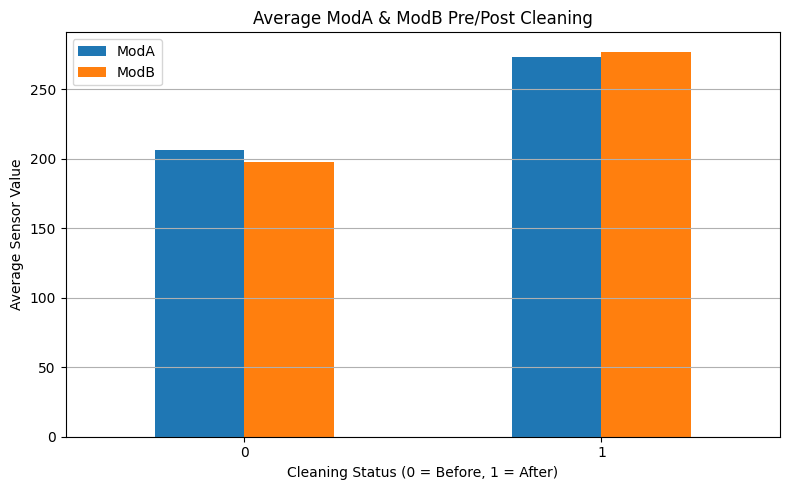

In [ ]:
cleaning_group = df.groupby('Cleaning')[['ModA', 'ModB']].mean()

# Plotting
cleaning_group.plot(kind='bar', figsize=(8, 5))
plt.title('Average ModA & ModB Pre/Post Cleaning')
plt.ylabel('Average Sensor Value')
plt.xlabel('Cleaning Status (0 = Before, 1 = After)')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.tight_layout()
plt.show()


correlation heatmap

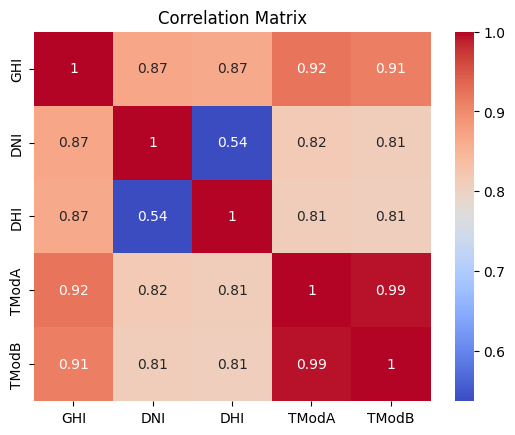

In [ ]:
corr = df[['GHI', 'DNI', 'DHI', 'TModA', 'TModB']].corr()
sns.heatmap(corr, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()


scatter plots

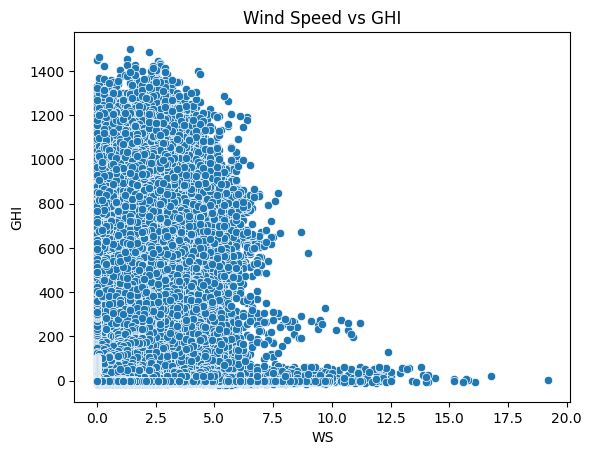

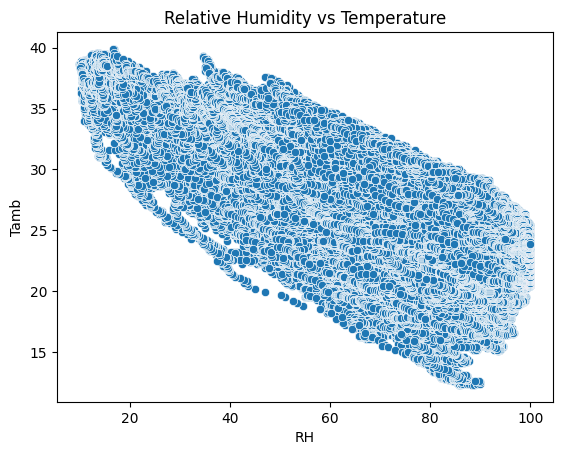

In [ ]:
sns.scatterplot(data=df, x='WS', y='GHI')
plt.title("Wind Speed vs GHI")
plt.show()

sns.scatterplot(data=df, x='RH', y='Tamb')
plt.title("Relative Humidity vs Temperature")
plt.show()


Histograms

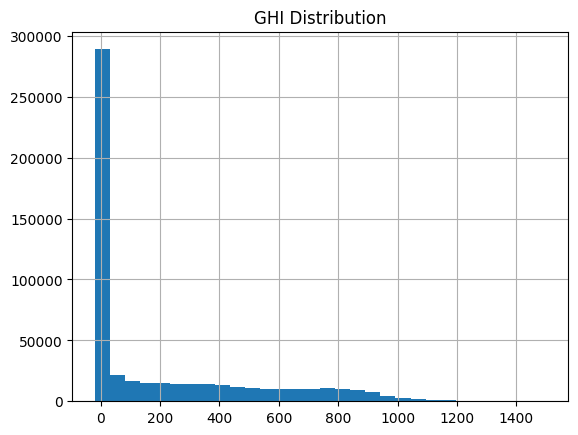

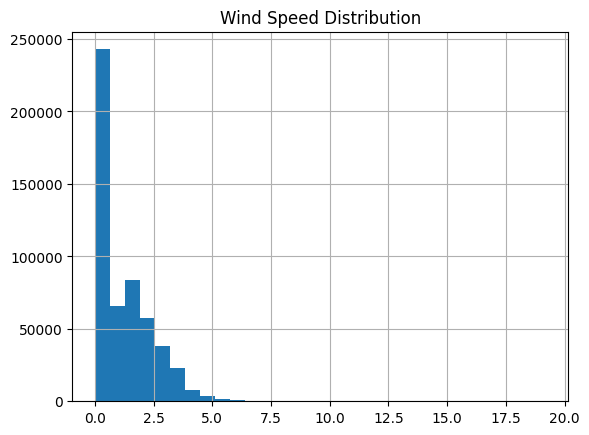

In [ ]:
df['GHI'].hist(bins=30)
plt.title("GHI Distribution")
plt.show()

df['WS'].hist(bins=30)
plt.title("Wind Speed Distribution")
plt.show()


Bubble chart

In [ ]:
fig = px.scatter(df, x="GHI", y="Tamb", size="RH", color="BP",
                 title="GHI vs Tamb (Bubble = RH, Color = BP)",
                 labels={"GHI":"Global Horizontal Irradiance", "Tamb":"Ambient Temperature"})
fig.show()
